# Data Capstone Project - Jonathan Ulrich

## 1 Introduction

### 1.1 Background
Berlin is a city of many faces. It is a vibrant, modern metropolis. It is home to 3,5 Million people from all over the world. Its diversity is mirrored by its venues!
Berlin is also where many significant events in modern history have taken place. Until 1989, Berlin was divided and part of two countries: The Federal Republic of Germany (BRD) and the German Democratic Republic (DDR). More than 30 years ago, the city has had time to heal. But many differences are still visible today, for example in architecture. Foodwise, Berlin is very diverse. It is the birthplace of the turkish style "Doener". From Japanese to Ethopian food, any cuisine from any country is available in Berlin. The city consists of 12 main districts and 138 subdistricts. 

### 1.2 Business Case
An investor specialized in opening new venues (cafes, restaurants, bars) is planning to move onto the Berlin market. He would like to infuse his strategy with a data driven approach. The idea is to see, which restaurants are predominantly favored in which district. As a next step, the districts are to be clustered. Through the clusters, potential for introducing new restaurants is to be identified by formulating new hypotheses.

## 2 Data Acquisition and Cleaning
### 2.1 Data Availability
Due to only having access to a basic Foursquare account, the access to data regarding venues and restaurants in Berlin is limited. At the beginning oft this project, the objective had been to analyze the restaurant distribution in relation to district income levels. This objective could not be pursued, for several reasons:

1.	Limited Foursquare API calls: Foursquare API allows only 500 calls per day for holders oft the basic plan. In an API call, either data regarding location, name and category of multiple venues or specific data to a single venue can be requested. As data of more than 6.900 venues has to be requested in 138 calls, the remaining 362 calls are not sufficient to request data for each venue specifically. 

2.	Income Data not publicly available for Subdistricts: Income data is only available on main district level.

### 2.2 Data Sources
The data is assembled from several sources:
Firstly, the location data of Berlins subdistricts is downloaded in form of a GeoJSON file from the URL https://data.technologiestiftung-berlin.de/dataset/lor_bezirksregionen/en. The districts are superimposed on a map of Berlin using Folium.
Secondly, venue data is extracted using the Foursquare API. Relevant venue data includes location and restaurant categories.

### 2.3	Data Cleaning and Preprocessing
- Berlin Subdistrict Data: The Berlin subdistrict data json file is imported and transformed into a geodataframe (gdf) using geopandas. Subsequently, irrelevant data columns are dropped. The location of each subdistrict is given as a polygon object. A point object and latitude and longitude coordinates are extracted from the polygon object, as Foursquare requires a single set of coordinates and then maps a number of venues in a certain radius of the coordinates. 
- Foursquare API Data: Using the coordinates extracted from the polygon object, a foursquare API call is conducted for each subdistrict for a radius of 1000m. Each API call with the basic plan can acquire the 50 top rated venues in the radius in form of a JSON file. Information regarding subdistrict, venue name, venue category and coordinates are extracted from the json file and inserted in a pandas dataframe.


### --> For more information on this project, please refer to the full report.

## Managing Imports

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans

!pip install folium
import folium # map rendering library
from folium.plugins import MarkerCluster

!pip install geopandas
import geopandas as gpd

import requests

import numpy as np

import six

print('Libraries imported.')

     |████████████████████████████████| 102kB 8.3MB/s ta 0:00:011
     |████████████████████████████████| 931kB 5.3MB/s eta 0:00:01
     |████████████████████████████████| 10.9MB 30.3MB/s eta 0:00:01
     |████████████████████████████████| 1.8MB 48.3MB/s eta 0:00:01
     |████████████████████████████████| 14.7MB 28.0MB/s eta 0:00:01
Libraries imported.


## Download, Exploration and Restructuring of Berlin geo Dataset

In [2]:
# Get JSON File from Website 
!wget -q -O 'berlin_data' https://tsb-opendata.s3.eu-central-1.amazonaws.com/lor_bezirksregionen/lor_bezirksregionen.geojson
    
# Transforming json into geodataframe (gdf) and having a look at head()
gdf = gpd.read_file('berlin_data')


# Restructuring gdf: Renaming and dropping columns
gdf = gdf.drop(['gml_id','spatial_name','spatial_type','spatial_alias','DATUM','SHAPE_AREA'], axis=1)
gdf = gdf.rename(columns={ 'BEZNAME':"District"})

# Assigning values of gdf to new object and transforming gdf back into json file
berlin_data = gdf
gdf = gdf.to_crs(epsg='4326').to_json()
print('')
print('This is restructured berlin_data gdf head')
berlin_data.head(5)


This is restructured berlin_data gdf head


,BZR_NAME,PGR_NAME,District,geometry
0,Tiergarten Süd,Zentrum,Mitte,"POLYGON ((13.36953 52.49887, 13.37036 52.49951..."
1,Regierungsviertel,Zentrum,Mitte,"POLYGON ((13.37686 52.51964, 13.37686 52.51947..."
2,Alexanderplatz,Zentrum,Mitte,"POLYGON ((13.40382 52.50809, 13.40404 52.50799..."
3,Brunnenstraße Süd,Zentrum,Mitte,"POLYGON ((13.40353 52.54021, 13.40180 52.53972..."
4,Moabit West,Moabit,Mitte,"POLYGON ((13.34474 52.53903, 13.34361 52.53918..."


In [3]:
#Extracting centroid of polygon object
berlin_data.insert(3,'centroid', berlin_data['geometry'].centroid, True)

#Extracting latitude and longitude from point object
center_lat = []
center_lng = []

for n in range(berlin_data.shape[0]):
    latlng = berlin_data['centroid'][n]
    center_lat.append(latlng.y)
    center_lng.append(latlng.x)
    

df2 = pd.DataFrame(list(zip(center_lat,center_lng)), columns=['lat','lng'])
    
berlin_data = pd.concat([berlin_data,df2], axis=1, sort=False)

#Creating list of district names
BZR_list = berlin_data['BZR_NAME'].tolist()

berlin_data.head(5)


,BZR_NAME,PGR_NAME,District,centroid,geometry,lat,lng
0,Tiergarten Süd,Zentrum,Mitte,POINT (13.35819 52.51046),"POLYGON ((13.36953 52.49887, 13.37036 52.49951...",52.510455,13.358192
1,Regierungsviertel,Zentrum,Mitte,POINT (13.39064 52.51416),"POLYGON ((13.37686 52.51964, 13.37686 52.51947...",52.514158,13.390642
2,Alexanderplatz,Zentrum,Mitte,POINT (13.40223 52.52085),"POLYGON ((13.40382 52.50809, 13.40404 52.50799...",52.520854,13.402227
3,Brunnenstraße Süd,Zentrum,Mitte,POINT (13.39336 52.53383),"POLYGON ((13.40353 52.54021, 13.40180 52.53972...",52.533828,13.393362
4,Moabit West,Moabit,Mitte,POINT (13.33215 52.53081),"POLYGON ((13.34474 52.53903, 13.34361 52.53918...",52.530806,13.332154


## Accessing Foursquare API and creating Venue Dataframe

In [43]:
#Function for creating a dataframe for a single district based on BZR_NAME and coordinates
df = pd.DataFrame

def map_venues(BZR_NAME,lat,lng):
    
    #generating url
    lat = lat
    lng = lng
    CLIENT_ID = 'QVHGTPVZKHIGS0NFAICGCOXEFUBB4B3NZEFJ0V4Z35YAK2QA' # your Foursquare ID
    CLIENT_SECRET = '42OBKHE5YWFMZ3550W1ADSF3EWOBCOPHDSMIS3XLMX15C4PY' # your Foursquare Secret
    VERSION = '20200601' # Foursquare API version
    LIMIT = 200 # set limit to be greater than or equal to the total number of tips
    radius = 1000
    url = 'https://api.foursquare.com/v2/venues/search?categoryId=4d4b7105d754a06374d81259&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
        CLIENT_ID, 
        CLIENT_SECRET, 
        VERSION,
        lat,
        lng,
        radius,
        LIMIT)
    
    #Accessing of Foursquare api based on generated url
    results = requests.get(url).json()

      
    
    #object preperation 
    venue_names_list = []
    venue_category_list = []
    venue_location_list = []
    BZR_NAME_list = []
    i=0
    
    
    #Extracting data from foursquare json file
    for n in range(len(results['response']['venues'])):
        try:
            venue_name = results['response']['venues'][n-1]['name']
            venue_category = results['response']['venues'][n-1]['categories'][0]['name']
            lat2 = results['response']['venues'][n-1]['location']['lat']
            lng2 = results['response']['venues'][n-1]['location']['lng']
            venue_location = (lat2,lng2)
            

        except IndexError:
            venue_name = 'NaN'
            venue_category = 'NaN'
            

        #Inserting extracted data into lists
        venue_names_list.append(venue_name)
        venue_category_list.append(venue_category)
        venue_location_list.append(venue_location)
        BZR_NAME_list.append(BZR_NAME)
        
            
    #Transforming Lists to dfs
    vn = pd.DataFrame(venue_names_list)
    vc = pd.DataFrame(venue_category_list)
    vl = pd.DataFrame(venue_location_list)
    bn = pd.DataFrame(BZR_NAME_list)
        
    #Merging DFs
    frames = [bn,vn,vc,vl]
    df = pd.concat(frames,axis=1)
        
    return df
    


In [44]:
#Function to assemble single dataframe for each district in one integrated dataframe
def main_func():
    berlin_venue_data = pd.DataFrame()

    for i in range(berlin_data.shape[0]):
        lat = berlin_data['lat'][i]
        lng = berlin_data['lng'][i]
        BZR_NAME = berlin_data['BZR_NAME'][i]

        df = map_venues(BZR_NAME,lat,lng)
        berlin_venue_data = berlin_venue_data.append(df)
    
    return berlin_venue_data

In [45]:
#Creating main_df as integrated df
main_df = main_func()
main_df.head(5)

,0,0,0,0,1
0,Tiergarten Süd,Burger King,Fast Food Restaurant,52.500477,13.363340
1,Tiergarten Süd,Kantine im Felleshus,Scandinavian Restaurant,52.508555,13.350813
2,Tiergarten Süd,El Greco,Café,52.500321,13.354374
3,Tiergarten Süd,Weltwirtschaft,Restaurant,52.519477,13.365061
4,Tiergarten Süd,Viet Bowl,Vietnamese Restaurant,52.506810,13.372338


## Restructuring of Venue Data

In [46]:
#Creation of venue_df - I had problems with free calls of Foursquare API, if I had ruined my main_df too often, so I created a second dataframe ;)
venue_df = main_df
venue_df.columns = ['BZR_NAME','venue','category', 'lat','lng']
venue_df = venue_df.reset_index(drop=True)
venue_df.head(5)

,BZR_NAME,venue,category,lat,lng
0,Tiergarten Süd,Burger King,Fast Food Restaurant,52.500477,13.363340
1,Tiergarten Süd,Kantine im Felleshus,Scandinavian Restaurant,52.508555,13.350813
2,Tiergarten Süd,El Greco,Café,52.500321,13.354374
3,Tiergarten Süd,Weltwirtschaft,Restaurant,52.519477,13.365061
4,Tiergarten Süd,Viet Bowl,Vietnamese Restaurant,52.506810,13.372338


## Analysis of Venue Data

In [47]:
# Finding the top10 restaurant categories in Berlin and restructuring dataframe
top10 = venue_df['category'].value_counts()
top10 = top10.to_frame()
top10 = top10.reset_index(drop=False)
top10 = top10.rename(columns={'index':'category', 'category':'number'})
top10.insert(2,"Percentage of Total",0)
top10['Percentage of Total'] = top10['number'].div(venue_df.shape[0]).multiply(100)
top10['Percentage of Total'] = top10['Percentage of Total'].round(1)
top10 = top10.head(10)

In [48]:
top10.head(10)

,category,number,Percentage of Total
0,Bakery,588,11.5
1,Café,508,10.0
2,Italian Restaurant,324,6.4
3,Coffee Shop,253,5.0
4,German Restaurant,237,4.7
5,Ice Cream Shop,188,3.7
6,Doner Restaurant,183,3.6
7,Pizza Place,169,3.3
8,Asian Restaurant,164,3.2
9,Restaurant,153,3.0


Text(0, 0.5, 'Number')

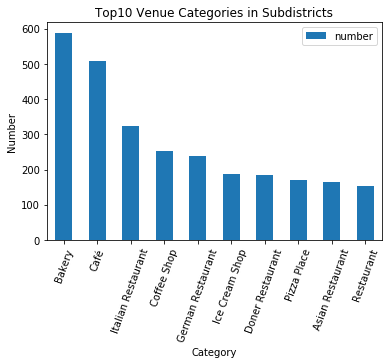

In [49]:
#Plotting total restaurants in top10 categories
top10.plot.bar(x='category', y='number', rot=0)
plt.xticks(rotation=70)


plt.title("Top10 Venue Categories in Subdistricts")
plt.xlabel("Category")
plt.ylabel("Number")

In [50]:
#Creating function to count values of top10 categories in each subdistrict
def count_venues ():

    top10_count = []
    category_list = top10['category'].tolist()
    count_list = []
    categorycount_list = []
    cat = 0

    for n in range(len(BZR_list)):
        BZR = BZR_list[n]
        df = venue_df[venue_df.BZR_NAME == BZR]
        count_list = []
    
        for i in range(len(category_list)):
            cat = category_list[i]

            count = (df.category == cat).sum()
            count_list.insert(i,count)
            count_list = list(count_list)
            
      
        categorycount_list.insert(n,count_list)
        
    categorycount_list = list(categorycount_list)
    
    
    print(type(categorycount_list))
    
    count_df = pd.DataFrame(categorycount_list)
     
    
    return count_df

In [51]:
#Creating pd.df objects and a list by using functions
count_df = count_venues()
category_list = top10['category'].tolist()
count_df.columns = category_list
count_df.insert(0, "BZR_NAME", BZR_list)
category_list = top10['category'].tolist()

<class 'list'>


In [52]:
count_df.head(10)

,BZR_NAME,Bakery,Café,Italian Restaurant,Coffee Shop,German Restaurant,Ice Cream Shop,Doner Restaurant,Pizza Place,Asian Restaurant,Restaurant
0,Tiergarten Süd,4,9,3,5,3,0,0,1,0,6
1,Regierungsviertel,2,6,2,6,4,1,0,0,0,2
2,Alexanderplatz,3,3,1,12,2,3,1,2,0,2
3,Brunnenstraße Süd,2,4,3,11,0,2,0,5,0,1
4,Moabit West,4,3,2,2,0,2,3,1,2,2
5,Moabit Ost,2,1,3,7,0,1,3,2,1,3
6,Osloer Straße,7,5,1,1,0,1,2,1,3,0
7,Brunnenstraße Nord,4,6,3,4,0,4,2,2,0,1
8,Parkviertel,6,8,2,1,0,2,0,1,1,2
9,Wedding Zentrum,3,7,1,2,0,0,3,3,0,3


## Creating Map of Berlin

In order to see how certain categories of restaurants (that are in top 50 rated) are spread over Berlin, Chloropleth maps are used. A Chloropleth map will be generated for each top 5 category as well as for Doner Restaurants, as this is Berlins signature dish!

In [53]:
# Determining Berlins Coordinates
address = 'Berlin'
geolocator = Nominatim(user_agent="berlin_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Berlin are {}, {}.'.format(latitude, longitude))

#Mapping Berlin Subdistricts and generating map
map_berlin = folium.Map(location=[latitude, longitude], zoom_start=11)
folium.GeoJson(gdf).add_to(map_berlin)
map_berlin

The geograpical coordinate of Berlin are 52.5170365, 13.3888599.


## Analysing venue Data with Chloropleth Maps

In [54]:
# Creating chloropleth maps for each category
heatmap_bakery = folium.Map(location=[latitude, longitude], zoom_start=11)
heatmap_cafe = folium.Map(location=[latitude, longitude], zoom_start=11)
heatmap_italian = folium.Map(location=[latitude, longitude], zoom_start=11)
heatmap_coffee = folium.Map(location=[latitude, longitude], zoom_start=11)
heatmap_german = folium.Map(location=[latitude, longitude], zoom_start=11)
heatmap_doner = folium.Map(location=[latitude, longitude], zoom_start=11)

In [55]:
#Funktion to determine percentage of the total of each categorie
def percentage(df,category):
    df.insert(2,"Percentage of Total",0)
    df['Percentage of Total'] = df[category].div(df.shape[0]).multiply(100)
    df['Percentage of Total'] = df['Percentage of Total'].round(1)
    return df

In [56]:
#Creating single dataframes for each category
bakery_df = count_df[['BZR_NAME', 'Bakery']]
bakery_df = bakery_df.sort_values(by=['Bakery'], ascending=False)
bakery_df = percentage(bakery_df,'Bakery')

cafe_df = count_df[['BZR_NAME', 'Café']]
cafe_df = cafe_df.sort_values(by=['Café'], ascending=False)
cafe_df = percentage(cafe_df,'Café')

italian_df = count_df[['BZR_NAME', 'Italian Restaurant']]
italian_df = italian_df.sort_values(by=['Italian Restaurant'], ascending=False)
italian_df = percentage(italian_df,'Italian Restaurant')

coffee_df = count_df[['BZR_NAME', 'Coffee Shop']]
coffee_df = coffee_df.sort_values(by=['Coffee Shop'], ascending=False)
coffee_df = percentage(coffee_df,'Coffee Shop')

german_df = count_df[['BZR_NAME', 'German Restaurant']]
german_df = german_df.sort_values(by=['German Restaurant'], ascending=False)
german_df = percentage(german_df,'German Restaurant')

doner_df = count_df[['BZR_NAME', 'Doner Restaurant']]
doner_df = doner_df.sort_values(by=['Doner Restaurant'], ascending=False)
doner_df = percentage(doner_df,'Doner Restaurant')


In [57]:
# Creating Chloropleth on maps
folium.Choropleth(
    geo_data=gdf,
    data=count_df,
    columns=['BZR_NAME', 'Bakery'],
    key_on='feature.properties.BZR_NAME',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Top Rated Bakery Density',
    reset=True
).add_to(heatmap_bakery)

folium.Choropleth(
    geo_data=gdf,
    data=count_df,
    columns=['BZR_NAME', 'Café'],
    key_on='feature.properties.BZR_NAME',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Top Rated Café Density',
    reset=True
).add_to(heatmap_cafe)

folium.Choropleth(
    geo_data=gdf,
    data=count_df,
    columns=['BZR_NAME', 'Italian Restaurant'],
    key_on='feature.properties.BZR_NAME',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Top Rated Italian Restaurant Density',
    reset=True
).add_to(heatmap_italian)

folium.Choropleth(
    geo_data=gdf,
    data=count_df,
    columns=['BZR_NAME', 'Coffee Shop'],
    key_on='feature.properties.BZR_NAME',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Top Rated Coffee SHop Density',
    reset=True
).add_to(heatmap_coffee)

folium.Choropleth(
    geo_data=gdf,
    data=count_df,
    columns=['BZR_NAME', 'German Restaurant'],
    key_on='feature.properties.BZR_NAME',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Top Rated German Restaurant Density',
    reset=True
).add_to(heatmap_german)

folium.Choropleth(
    geo_data=gdf,
    data=count_df,
    columns=['BZR_NAME', 'Doner Restaurant'],
    key_on='feature.properties.BZR_NAME',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name='Top Rated Doner Restaurant Density',
    reset=True
).add_to(heatmap_doner)

In [58]:
heatmap_bakery

In [59]:
bakery_df.head(5)

,BZR_NAME,Bakery,Percentage of Total
126,Karlshorst,13,9.4
79,Köllnische Heide,12,8.7
62,Lankwitz,12,8.7
74,Lichtenrade,10,7.2
61,Albrechtstraße,10,7.2


In [60]:
heatmap_cafe

In [61]:
cafe_df.head(5)

,BZR_NAME,Café,Percentage of Total
24,Pankow Zentrum,12,8.7
78,Rixdorf,11,8.0
29,Prenzlauer Berg Nord,10,7.2
40,Neue Kantstraße,10,7.2
0,Tiergarten Süd,9,6.5


In [62]:
heatmap_italian

In [63]:
italian_df.head(5)

,BZR_NAME,Italian Restaurant,Percentage of Total
44,Grunewald,10,7.2
137,West 3 - Borsigwalde/Freie Scholle,9,6.5
45,Schmargendorf,8,5.8
61,Albrechtstraße,6,4.3
14,Karl-Marx-Allee Nord,6,4.3


In [64]:
heatmap_coffee

In [65]:
coffee_df.head(5)

,BZR_NAME,Coffee Shop,Percentage of Total
12,Nördliche Luisenstadt,12,8.7
2,Alexanderplatz,12,8.7
3,Brunnenstraße Süd,11,8.0
77,Reuterstraße,11,8.0
13,Südliche Luisenstadt,11,8.0


In [66]:
heatmap_german

In [67]:
german_df.head(5)

,BZR_NAME,German Restaurant,Percentage of Total
92,Köllnische Vorstadt/Spindlersfeld,9,6.5
99,Altstadt Kietz,7,5.1
83,Buckow Nord,7,5.1
103,Dammvorstadt,7,5.1
74,Lichtenrade,5,3.6


In [68]:
heatmap_doner

In [69]:
doner_df.head(5)

,BZR_NAME,Doner Restaurant,Percentage of Total
104,Köpenick Nord,6,4.3
136,MV 2 - Rollbergesiedlung,5,3.6
127,Ost 1 - Reginhardstr.,5,3.6
110,Hellersdorf Süd,4,2.9
108,Hellersdorf Nord,4,2.9


## Cluster Analysis

Idea is to cluster Berlin districts to see what similarities they have to each other. Based on the determined clusters, further hypothesises can be defined.

In [70]:
#Preparing df for clustering
cluster_df = count_df
cluster_df.insert(1,'Clus_Db',0)

In [71]:
# Importing packages for Dbscan
from sklearn.cluster import DBSCAN
import sklearn.utils
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics.cluster import completeness_score, homogeneity_score, v_measure_score, adjusted_rand_score, adjusted_mutual_info_score

#Restructuring dataset and fitting function
sklearn.utils.check_random_state(1000)
Clus_dataSet = count_df.drop(['BZR_NAME'], axis=1)
Clus_dataSet = np.nan_to_num(Clus_dataSet)
Clus_dataSet = StandardScaler().fit_transform(Clus_dataSet)

# Compute DBSCAN
db = DBSCAN(eps=2.0, min_samples=3).fit(Clus_dataSet)
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_
cluster_df["Clus_Db"]=labels

realClusterNum=len(set(labels)) - (1 if -1 in labels else 0)
clusterNum = len(set(labels)) 

len(set(labels))

#Viszualizing clusters on Berlin map
heatmap_cluster = folium.Map(location=[latitude, longitude], zoom_start=11)
folium.Choropleth(
    geo_data=gdf,
    data=cluster_df,
    columns=['BZR_NAME', 'Clus_Db'],
    key_on='feature.properties.BZR_NAME',
    fill_color='Set1',
    fill_opacity=0.5,
    line_opacity=0.5,
    legend_name='Clusters',
    reset=True,
    bins = 7
).add_to(heatmap_cluster)
heatmap_cluster



/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/opt/conda/envs/Python36/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


In [72]:
len(set(labels))

8

In [73]:
#Exploring count_df
count_df

,BZR_NAME,Clus_Db,Bakery,Café,Italian Restaurant,Coffee Shop,German Restaurant,Ice Cream Shop,Doner Restaurant,Pizza Place,Asian Restaurant,Restaurant
0,Tiergarten Süd,-1,4,9,3,5,3,0,0,1,0,6
1,Regierungsviertel,-1,2,6,2,6,4,1,0,0,0,2
2,Alexanderplatz,-1,3,3,1,12,2,3,1,2,0,2
3,Brunnenstraße Süd,1,2,4,3,11,0,2,0,5,0,1
4,Moabit West,-1,4,3,2,2,0,2,3,1,2,2
5,Moabit Ost,-1,2,1,3,7,0,1,3,2,1,3
6,Osloer Straße,0,7,5,1,1,0,1,2,1,3,0
7,Brunnenstraße Nord,4,4,6,3,4,0,4,2,2,0,1
8,Parkviertel,-1,6,8,2,1,0,2,0,1,1,2
9,Wedding Zentrum,-1,3,7,1,2,0,0,3,3,0,3


In [74]:
#creating df for each cluster
count_df = count_df.rename(columns={'Clus_Db':'Cluster'})

cluster0 = count_df.loc[count_df['Cluster'] ==0]
cluster0 = cluster0.reset_index(drop=True)
cluster1 = count_df.loc[count_df['Cluster'] ==1]
cluster1 = cluster1.reset_index(drop=True)
cluster2 = count_df.loc[count_df['Cluster'] ==2]
cluster2 = cluster2.reset_index(drop=True)
cluster3 = count_df.loc[count_df['Cluster'] ==3]
cluster3 = cluster3.reset_index(drop=True)
cluster4 = count_df.loc[count_df['Cluster'] ==4]
cluster4 = cluster4.reset_index(drop=True)
cluster5 = count_df.loc[count_df['Cluster'] ==5]
cluster5 = cluster5.reset_index(drop=True)
cluster6 = count_df.loc[count_df['Cluster'] ==6]
cluster6 = cluster6.reset_index(drop=True)

In [75]:
#Exploring clusters 0-6
cluster0

,BZR_NAME,Cluster,Bakery,Café,Italian Restaurant,Coffee Shop,German Restaurant,Ice Cream Shop,Doner Restaurant,Pizza Place,Asian Restaurant,Restaurant
0,Osloer Straße,0,7,5,1,1,0,1,2,1,3,0
1,Buch,0,0,0,0,0,0,0,0,0,0,0
2,Blankenfelde/Niederschönhausen,0,0,3,0,0,0,0,0,0,0,0
3,Buchholz,0,3,1,1,1,0,2,1,1,0,1
4,Karow,0,4,0,2,1,2,0,1,1,2,1
5,Blankenburg/Heinersdorf/Märchenland,0,0,1,0,0,0,0,0,0,0,2
6,Schönholz/Wilhelmsruh/Rosenthal,0,4,3,2,0,2,1,1,2,1,1
7,Weißensee Ost,0,3,4,1,0,5,0,2,1,1,0
8,Prenzlauer Berg Süd,0,5,6,3,3,0,5,0,1,2,0
9,Charlottenburg Nord,0,4,1,2,0,1,0,2,1,0,1


In [76]:
cluster1

,BZR_NAME,Cluster,Bakery,Café,Italian Restaurant,Coffee Shop,German Restaurant,Ice Cream Shop,Doner Restaurant,Pizza Place,Asian Restaurant,Restaurant
0,Brunnenstraße Süd,1,2,4,3,11,0,2,0,5,0,1
1,Nördliche Luisenstadt,1,1,3,3,12,0,1,0,2,0,0
2,Südliche Luisenstadt,1,0,4,4,11,0,2,0,4,0,0
3,Reuterstraße,1,0,5,4,11,0,0,0,4,0,0


In [77]:
cluster2

,BZR_NAME,Cluster,Bakery,Café,Italian Restaurant,Coffee Shop,German Restaurant,Ice Cream Shop,Doner Restaurant,Pizza Place,Asian Restaurant,Restaurant
0,Karl-Marx-Allee Nord,2,5,5,6,2,3,1,3,2,1,0
1,Wiesbadener Straße,2,6,7,5,1,3,1,3,4,2,0
2,Zehlendorf Nord,2,6,7,4,1,3,0,2,1,1,0


In [78]:
cluster3

,BZR_NAME,Cluster,Bakery,Café,Italian Restaurant,Coffee Shop,German Restaurant,Ice Cream Shop,Doner Restaurant,Pizza Place,Asian Restaurant,Restaurant
0,Prenzlauer Berg Nordwest,3,4,9,1,4,2,1,2,0,0,0
1,Prenzlauer Berg Nord,3,5,10,1,1,3,1,2,0,2,0
2,Neue Kantstraße,3,5,10,3,3,3,1,1,1,2,1
3,Kantstraße,3,4,8,3,6,2,1,1,0,1,0
4,Kurfürstendamm,3,5,5,1,5,3,1,1,0,1,0


In [79]:
cluster4

,BZR_NAME,Cluster,Bakery,Café,Italian Restaurant,Coffee Shop,German Restaurant,Ice Cream Shop,Doner Restaurant,Pizza Place,Asian Restaurant,Restaurant
0,Brunnenstraße Nord,4,4,6,3,4,0,4,2,2,0,1
1,Prenzlauer Berg Südwest,4,4,9,2,6,0,4,0,3,0,0
2,Schöneberg Nord,4,4,8,3,6,0,5,1,2,0,1


In [80]:
cluster5

,BZR_NAME,Cluster,Bakery,Café,Italian Restaurant,Coffee Shop,German Restaurant,Ice Cream Shop,Doner Restaurant,Pizza Place,Asian Restaurant,Restaurant
0,Köllnische Vorstadt/Spindlersfeld,5,2,8,3,2,9,1,2,1,0,2
1,Altstadt Kietz,5,1,9,4,1,7,1,2,2,0,2
2,Dammvorstadt,5,2,9,3,1,7,1,3,0,0,2


In [81]:
cluster6

,BZR_NAME,Cluster,Bakery,Café,Italian Restaurant,Coffee Shop,German Restaurant,Ice Cream Shop,Doner Restaurant,Pizza Place,Asian Restaurant,Restaurant
0,Teltower Damm,6,8,5,4,3,0,0,2,2,2,0
1,Tempelhof,6,8,4,5,1,1,2,3,1,3,2
2,Nord 2 - Waidmannslust/Wittenau/Lübars,6,10,0,5,0,1,1,3,2,4,1
3,MV 1 - Märkisches Viertel,6,9,2,4,1,1,1,2,2,3,1
